## Sentinel-1 Scene Viewer
This notebook demonstrates viewing of Sentinel-1 radar scenes which contain VV and VH bands. The products demonstrate grey-scale VV and VH ouputs and falase-color RGB outputs for improved viewing. 

In [1]:
# Supress Warnings 
import warnings
warnings.filterwarnings('ignore')

# Import common GIS tools
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray as rio
import rasterio.features
from PIL import Image

# Import Planetary Computer tools
import stackstac
import pystac_client
import planetary_computer as pc
import xrspatial.multispectral as ms
import odc
from odc.stac import stac_load

### Define the analysis region and load the data

In [18]:
# Vanuatu Island
ll = (-15.5066, 166.70)
ur = (-15.2688, 167.05)
time_of_interest = "2020-01-01/2020-03-05"

In [19]:
bbox = [ll[1], ll[0], ur[1], ur[0]]

Using the `pystac_client` we can search the Planetary Computer's STAC endpoint for items matching our query parameters. The result is the number of scenes matching our search criteria that touch our area of interest. Some of these may be partial scenes. 

In [20]:
catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

In [21]:
# We will only load a specific orbit path (descending or ascending)

search = catalog.search(
    collections=["sentinel-1-rtc"], 
    bbox=bbox, 
    datetime=time_of_interest,
    query={"sat:orbit_state": {"eq": "descending"}}
)

In [22]:
items = list(search.get_all_items()) # This produces a list of scene IDs

In [23]:
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 6


Next, we'll load the data into an XARRAY and then "clip" the data to only the pixels within our region (bounding box). We will only keep the desired bands (VV, VH). We have changed the projection to epsg=4326 which is standard latitude-longitude in degrees and we have specified the spatial resolution of each pixel to be 10-meters, which is the baseline accuracy for this data. 

In [24]:
# Define the pixel resolution for the final product
# Define the scale according to our selected crs, so we will use degrees
# Use 10-meters resolution for the baseline (best) resolution - DATA VOLUMES CAN BE HIGH
# Use 100-meters for rapid review of the datasets

resolution = 20  # meters per pixel 
scale = resolution / 111320.0 # degrees per pixel for crs=4326 

In [25]:
# Load the data using Open Data Cube
data = stac_load(
    items,bands=["vv", "vh"], 
    patch_url=pc.sign, 
    bbox=bbox, 
    crs="EPSG:4326", 
    resolution=scale, 
    groupby="solar_day"
)

In [26]:
# View the details of our xarray dataset
# The X and Y dimensions tell us the pixel dimensions of our bounding box
# The "time" variable is the number of scenes that touch our region
data

<xarray.Dataset> Size: 124MB
Dimensions:      (latitude: 1324, longitude: 1949, time: 6)
Coordinates:
  * latitude     (latitude) float64 11kB -15.27 -15.27 -15.27 ... -15.51 -15.51
  * longitude    (longitude) float64 16kB 166.7 166.7 166.7 ... 167.0 167.1
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 48B 2020-01-05T18:20:33.983932 ... 202...
Data variables:
    vv           (time, latitude, longitude) float32 62MB -3.277e+04 ... 1.444
    vh           (time, latitude, longitude) float32 62MB -3.277e+04 ... 0.0882

In [27]:
memory_usage_bytes = data.nbytes/1000000
print(f"Memory usage: {memory_usage_bytes} MB")

Memory usage: 123.889084 MB


In [28]:
# Adjust band data for improved RGB output
vv_new = data.vv / 6
vh_new = data.vh / 1
data['vv_new'] = vv_new
data['vh_new'] = vh_new
data['vvvh_new'] = (vv_new / vh_new) / 30

### View RGB (false color) images from the time series

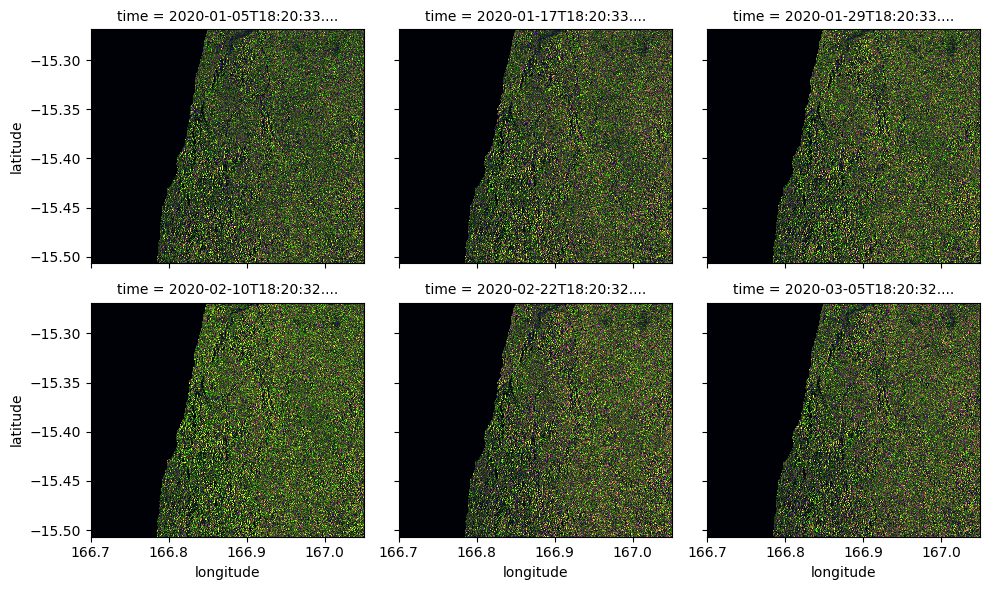

In [29]:
# Plot small images for the entire dataset
# CAUTION ... This can produce lots of images in a large time series

plot_data = data[["vv_new","vh_new","vvvh_new"]].to_array()
plot_data.plot.imshow(col='time', col_wrap=3, vmin=0.0, vmax=0.2)
plt.show()

In [30]:
# Select a time slice to view a single scene
# See the XARRAY dimensions above for the number of time slices (starts at 0)
slice = 0

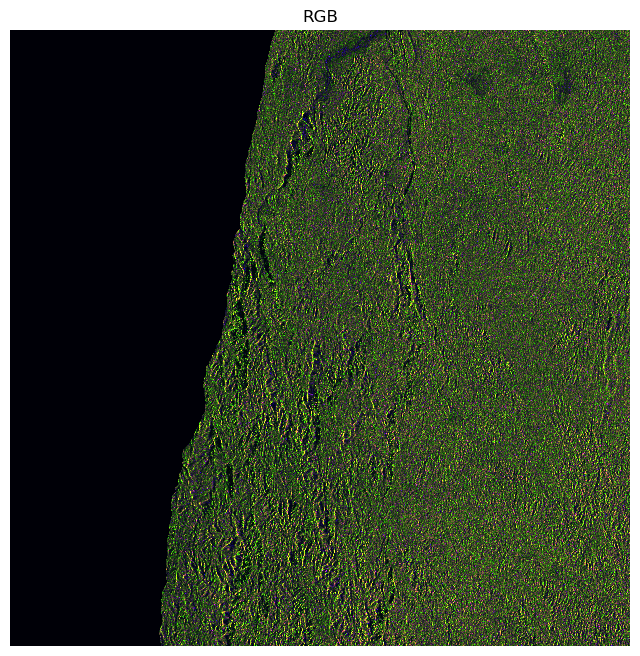

In [31]:
fig, ax = plt.subplots(figsize=(8,8))
plot_data.isel(time=slice).plot.imshow(robust=True, ax=ax, vmin=0.0, vmax=0.2)
plt.title("RGB")
plt.axis('off')
plt.show()

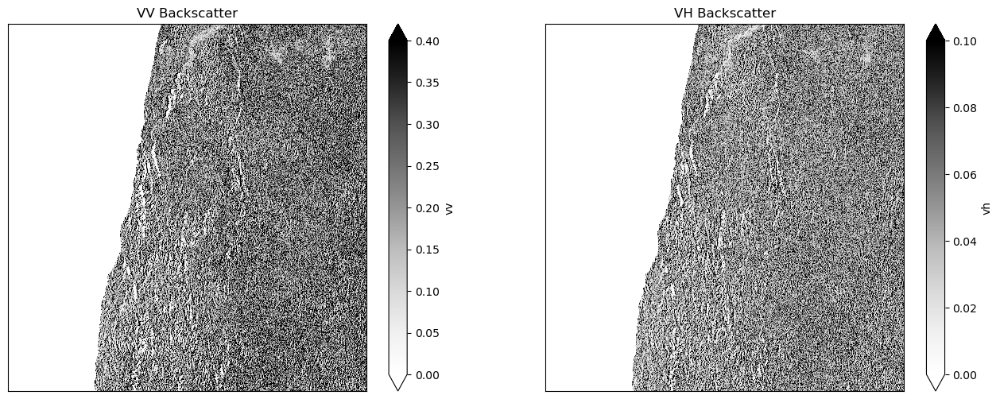

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(16,6))
data.vv.isel(time=slice).plot(ax=ax[0], robust=True, vmin=0.0, vmax=0.4, cmap="Greys")
data.vh.isel(time=slice).plot(ax=ax[1], robust=True, vmin=0.0, vmax=0.1, cmap="Greys")
ax[0].set_title('VV Backscatter'), ax[0].xaxis.set_visible(False), ax[0].yaxis.set_visible(False)
ax[1].set_title('VH Backscatter'), ax[1].xaxis.set_visible(False), ax[1].yaxis.set_visible(False)
plt.show()

In [33]:
# Make an interactive map plot, so we can zoom in on the area of interest
data.isel(time=slice).odc.explore(bands=["vv_new", "vh_new", "vvvh_new"], vmin=0, vmax=0.2)